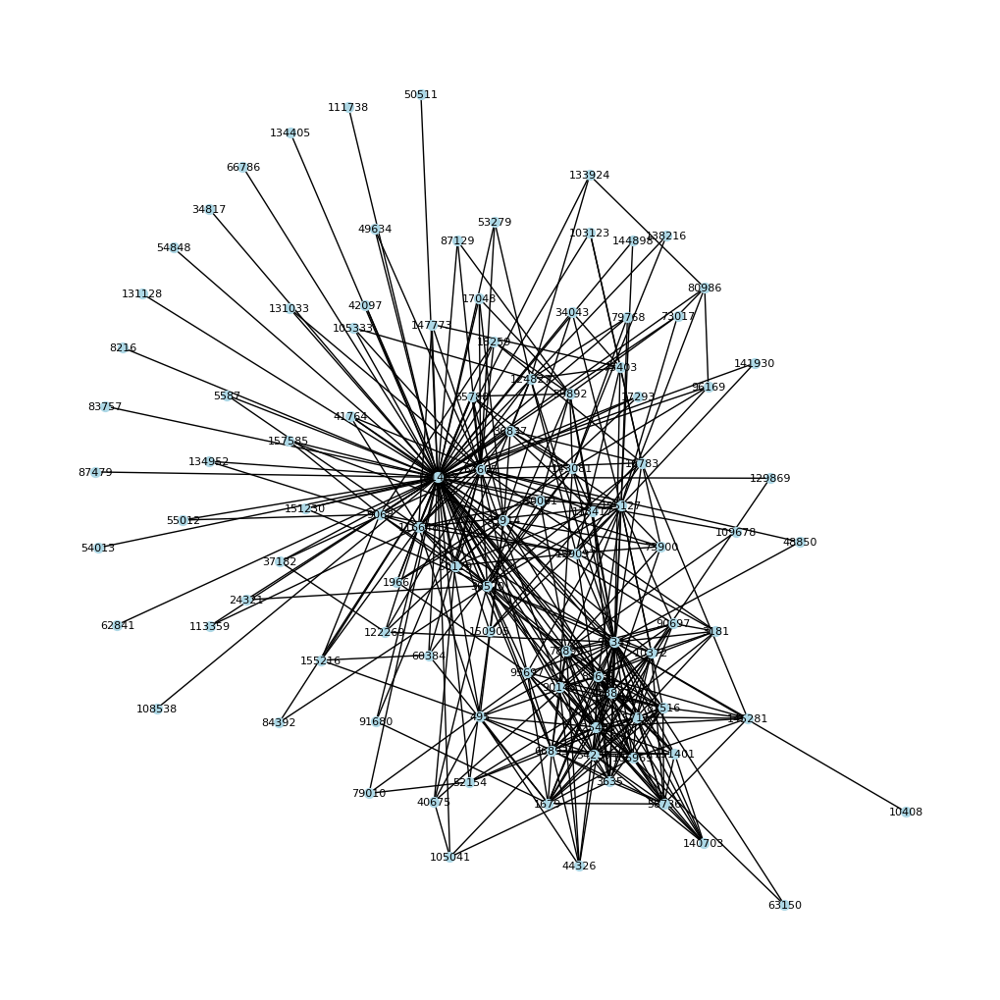

In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Load the edge list CSV
edges_df = pd.read_csv('large_twitch_edges.csv')

# Initialize an undirected graph
G = nx.Graph()

# Add edges from the DataFrame to the graph
for _, row in edges_df.iterrows():
    G.add_edge(row['numeric_id_1'], row['numeric_id_2'])

# Visualize a small subgraph
subgraph = G.subgraph(list(G.nodes())[:100])  # Visualize the first 100 nodes

plt.figure(figsize=(10, 10))
nx.draw(subgraph, with_labels=True, node_size=50, node_color="lightblue", font_size=8)
plt.show()

In [ ]:
edges_df.head()

,numeric_id_1,numeric_id_2
0,98343,141493
1,98343,58736
2,98343,140703
3,98343,151401
4,98343,157118


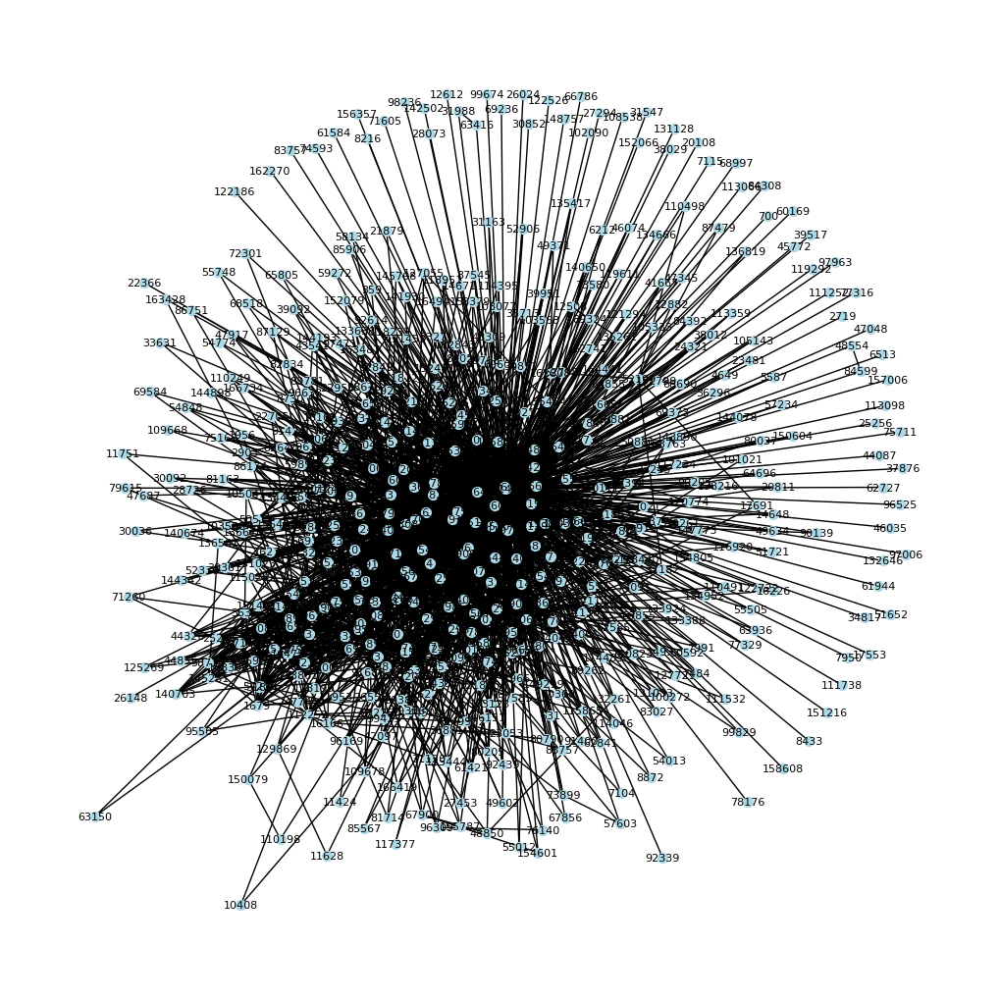

In [ ]:
subgraph = G.subgraph(list(G.nodes())[:500])  # Visualize the first 500 nodes

plt.figure(figsize=(10, 10))
nx.draw(subgraph, with_labels=True, node_size=50, node_color="lightblue", font_size=8)
plt.show()

In [ ]:
import pandas as pd

# Load the features CSV
features_df = pd.read_csv('large_twitch_features.csv')

# Add node attributes from the features DataFrame
for _, row in features_df.iterrows():
    node_id = row['numeric_id']
    if node_id in G:  # Ensure the node exists in the graph
        G.nodes[node_id]['views'] = row['views']
        G.nodes[node_id]['mature'] = row['mature']
        G.nodes[node_id]['life_time'] = row['life_time']
        G.nodes[node_id]['created_at'] = row['created_at']
        G.nodes[node_id]['updated_at'] = row['updated_at']
        G.nodes[node_id]['dead_account'] = row['dead_account']
        G.nodes[node_id]['language'] = row['language']
        G.nodes[node_id]['affiliate'] = row['affiliate']

# Print the attributes of the first node
print(G.nodes[list(G.nodes())[0]])
# features_df.head()

{'views': 282, 'mature': 0, 'life_time': 2086, 'created_at': '2012-12-27', 'updated_at': '2018-09-13', 'dead_account': 0, 'language': 'EN', 'affiliate': 0}


In [ ]:
import networkx.algorithms.community as nx_comm
partition = nx_comm.louvain_communities(G, seed=123)  # Use a seed for reproducibility

# Print the number of communities and modularity score
print("# of communities: ", len(partition), ", modularity score: ", nx_comm.modularity(G, partition))

# of communities:  22 , modularity score:  0.4235316396651982


<ipython-input-33-f89197ac7460>:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('rainbow', num_communities + 1)


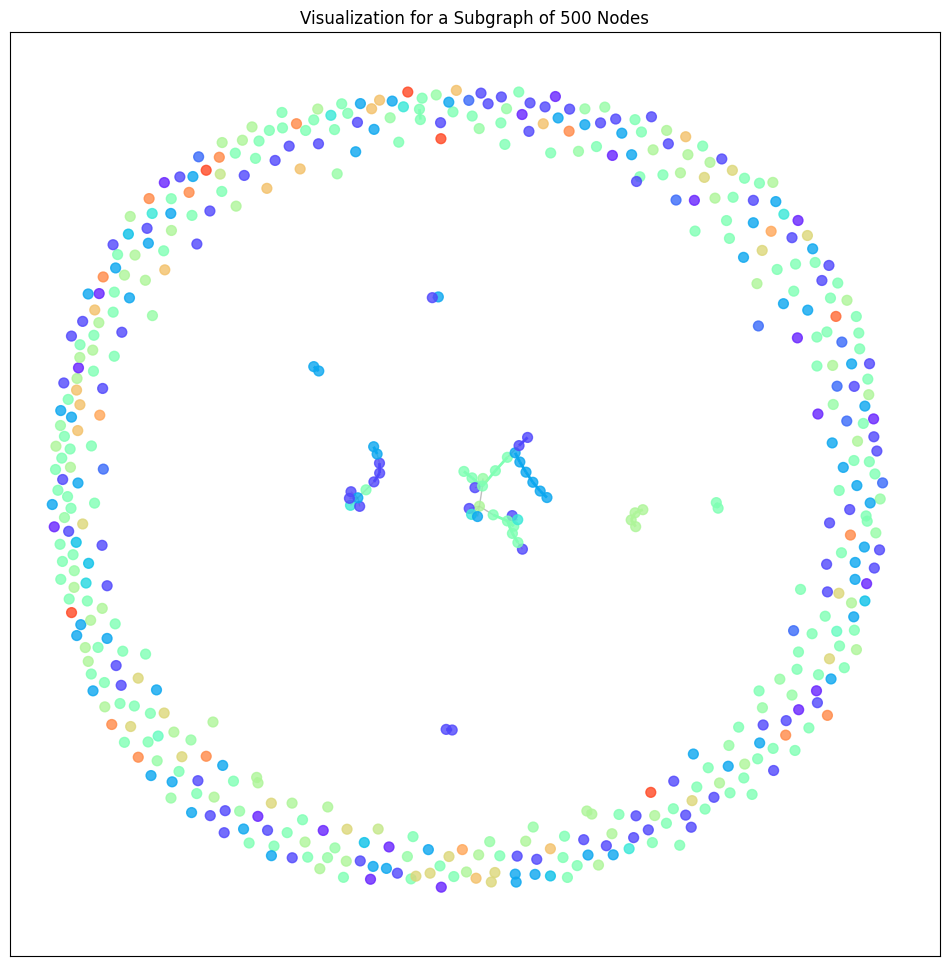

In [ ]:
import random
import matplotlib.pyplot as plt

# Function to add community information to nodes
def set_node_community(G, communities):
    '''Add community to node attributes'''
    for c, community in enumerate(communities):
        for node in community:
            # Assign community index + 1 to avoid using 0 for internal edges
            G.nodes[node]['community'] = c + 1

# Function to find internal edges and add their community to their attributes
def set_edge_community(G):
    '''Find internal edges and add their community to their attributes'''
    for v, w in G.edges:
        if G.nodes[v]['community'] == G.nodes[w]['community']:
            # Internal edge, mark with community
            G.edges[v, w]['community'] = G.nodes[v]['community']
        else:
            # External edge, mark as 0
            G.edges[v, w]['community'] = 0

# Function to get color based on community ID
def get_color(community_id, color_map):
    '''Get color based on community ID'''
    return color_map(community_id)

# Set node and edge communities
set_node_community(G, partition)
set_edge_community(G)

# Define a colormap for communities
num_communities = len(partition)
color_map = plt.cm.get_cmap('rainbow', num_communities + 1)

# Sample 500 nodes from the original graph for visualization
sample_nodes = random.sample(list(G.nodes), 500)
subgraph = G.subgraph(sample_nodes)

# Define colors for nodes and internal edges based on the subgraph's communities
subgraph_node_color = [get_color(subgraph.nodes[v]['community'], color_map) for v in subgraph.nodes]
subgraph_external_edges = [(v, w) for v, w in subgraph.edges if subgraph.edges[v, w]['community'] == 0]
subgraph_internal_edges = [(v, w) for v, w in subgraph.edges if subgraph.edges[v, w]['community'] > 0]
subgraph_internal_edge_color = [get_color(subgraph.edges[e]['community'], color_map) for e in subgraph_internal_edges]

# Visualize the subgraph with coloring
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(subgraph, seed=42)  # Use a fixed layout for reproducibility

# Draw edges in gray
nx.draw_networkx_edges(subgraph, pos, edgelist=subgraph_external_edges, edge_color="gray", alpha=0.5, width=1)

# Draw internal edges with colors
nx.draw_networkx_edges(subgraph, pos, edgelist=subgraph_internal_edges, edge_color=subgraph_internal_edge_color, width=2)

# Draw nodes with colors
nx.draw_networkx_nodes(subgraph, pos, node_color=subgraph_node_color, node_size=50, alpha=0.8)

plt.title("Visualization for a Subgraph of 500 Nodes")
plt.show()

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


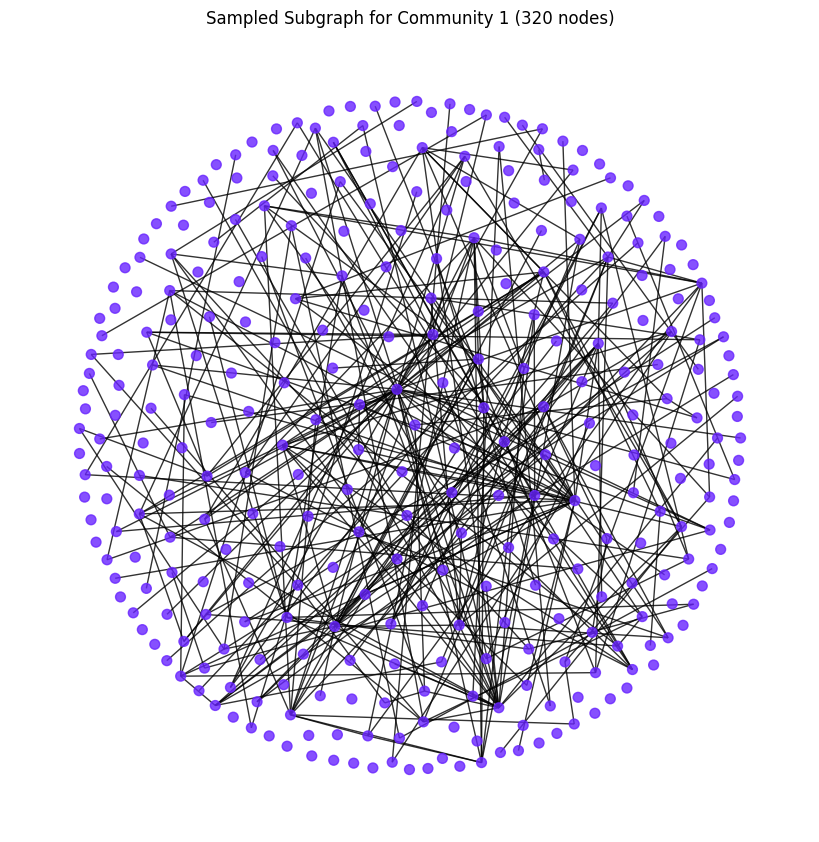

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


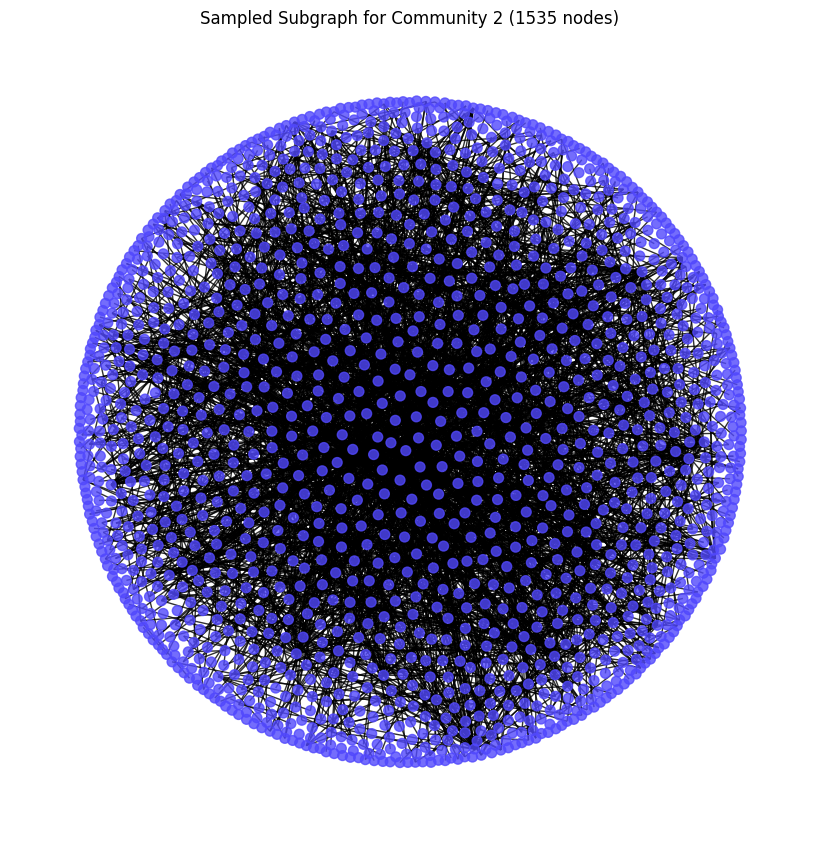

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


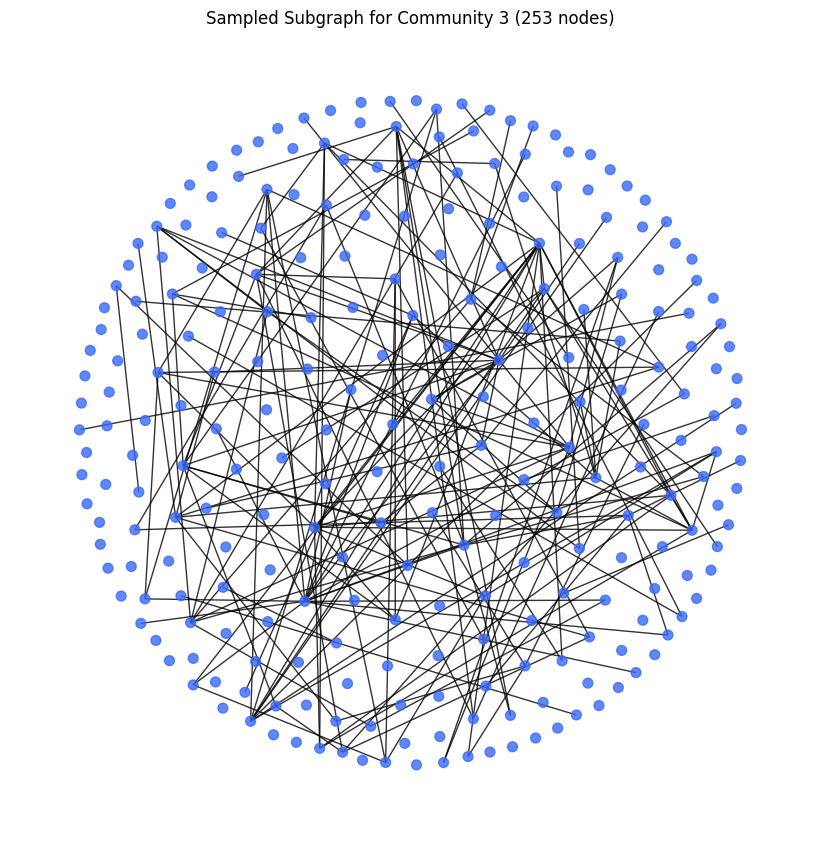

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


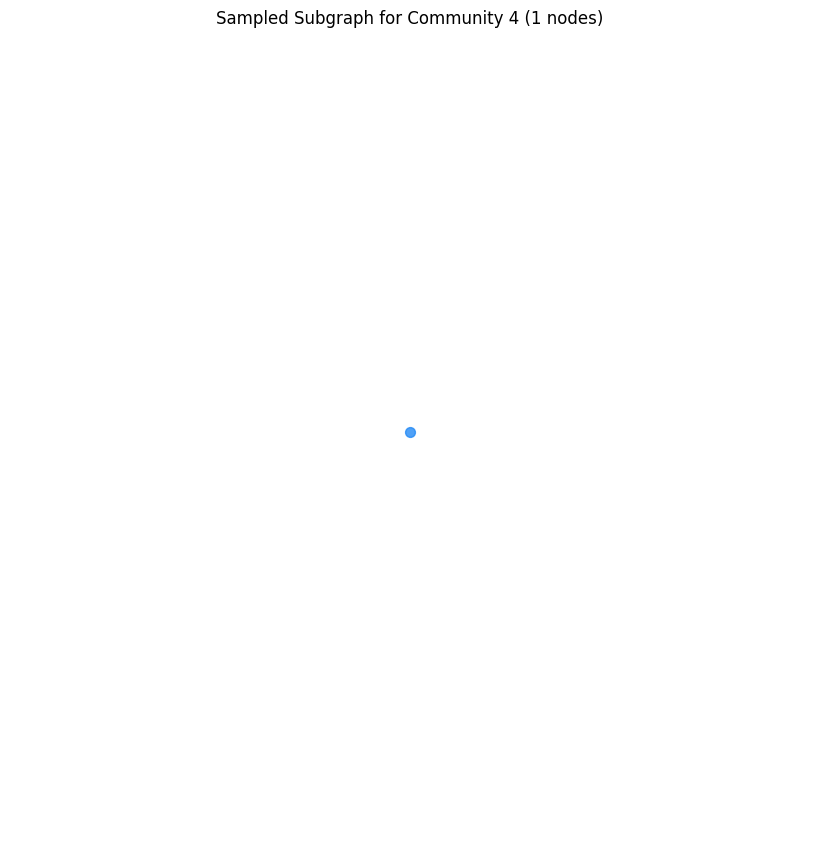

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


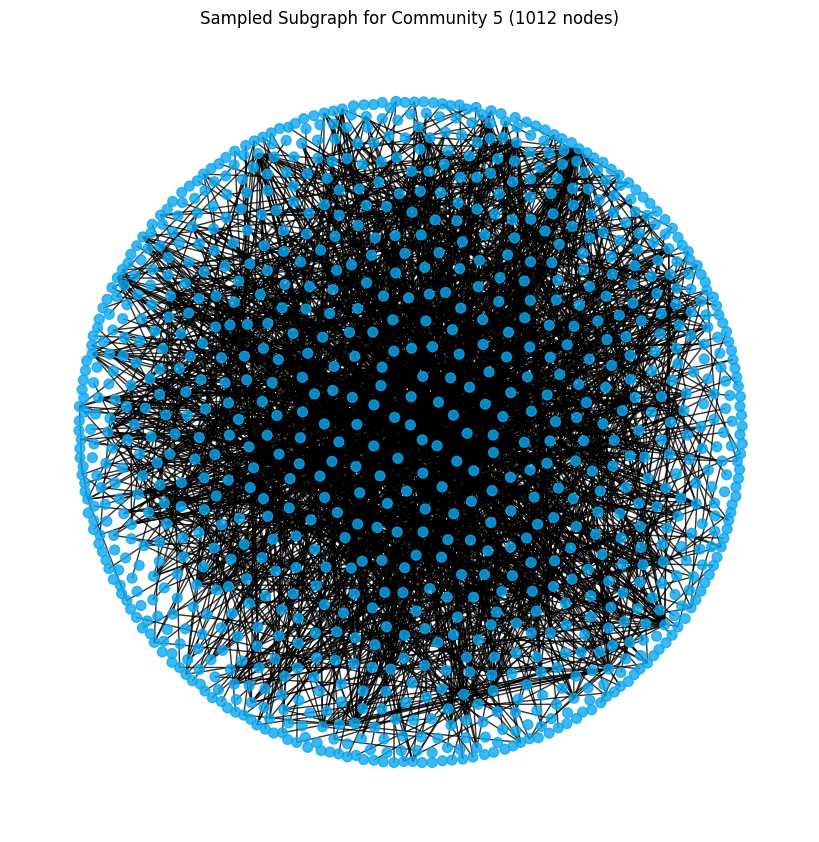

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


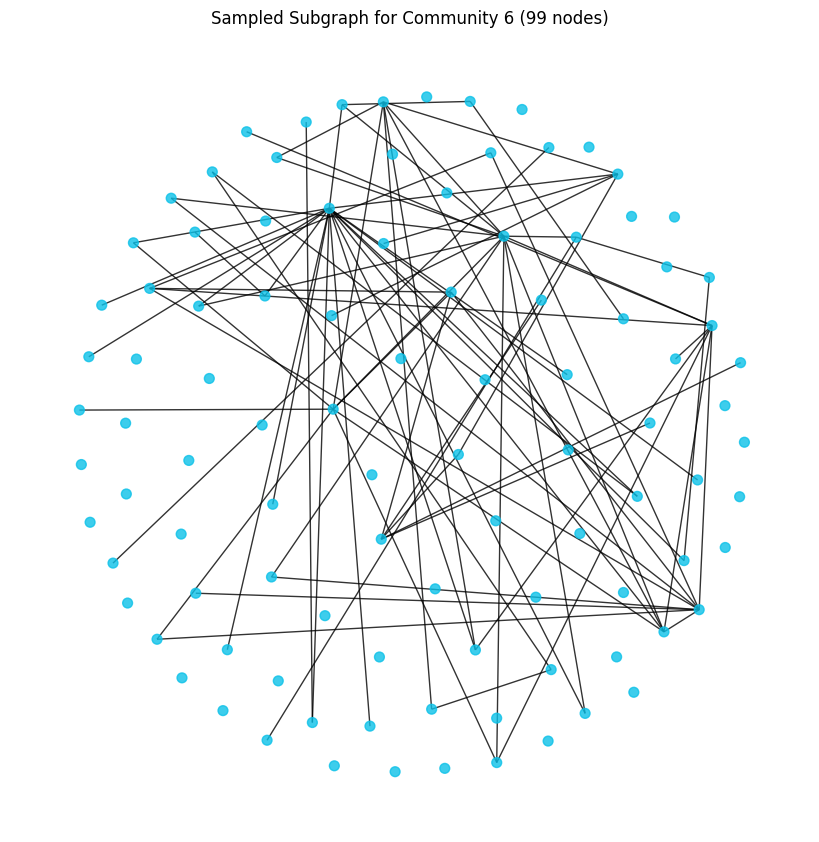

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


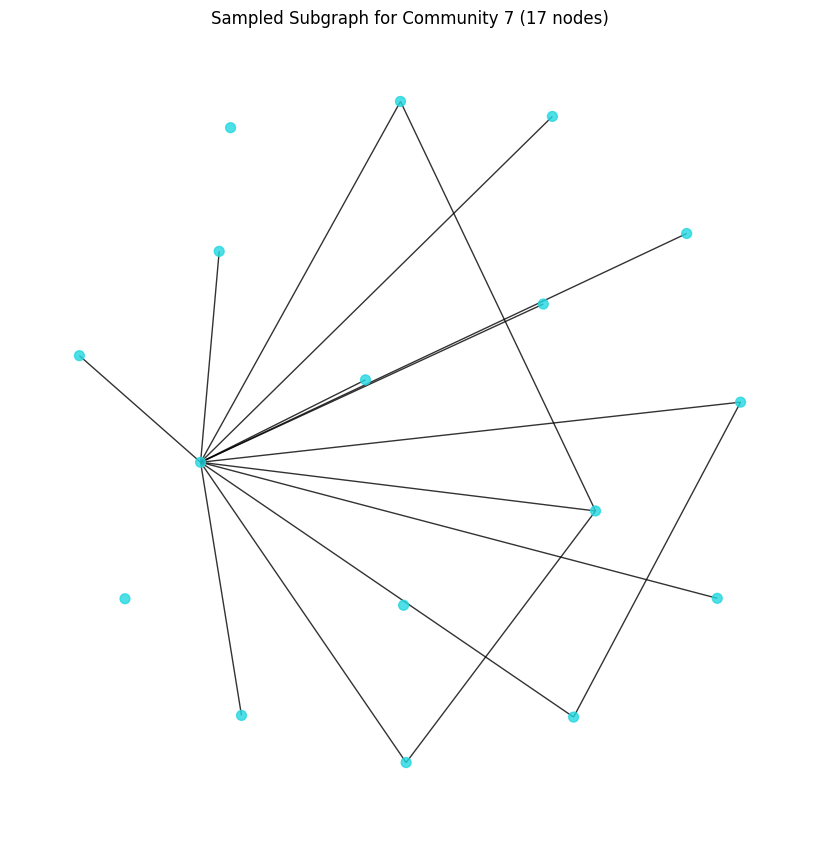

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


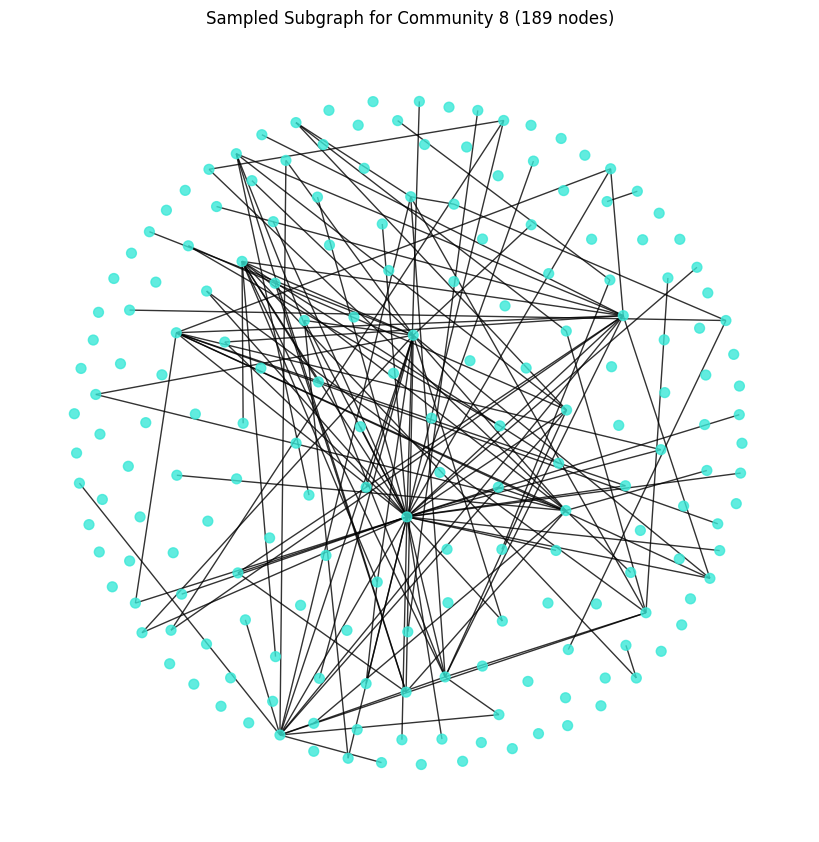

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


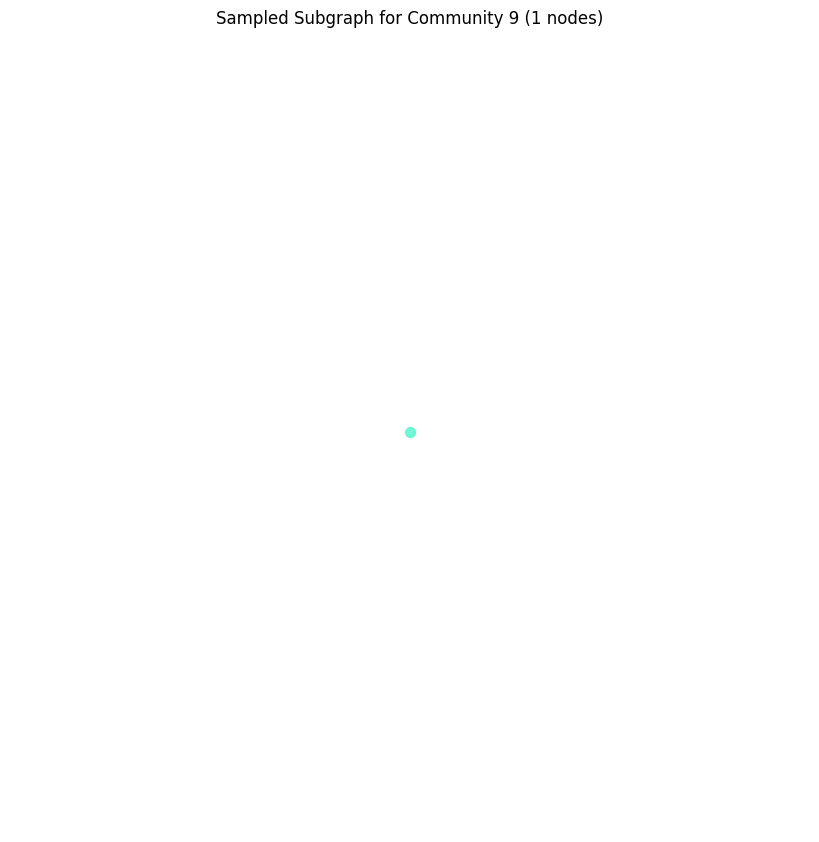

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


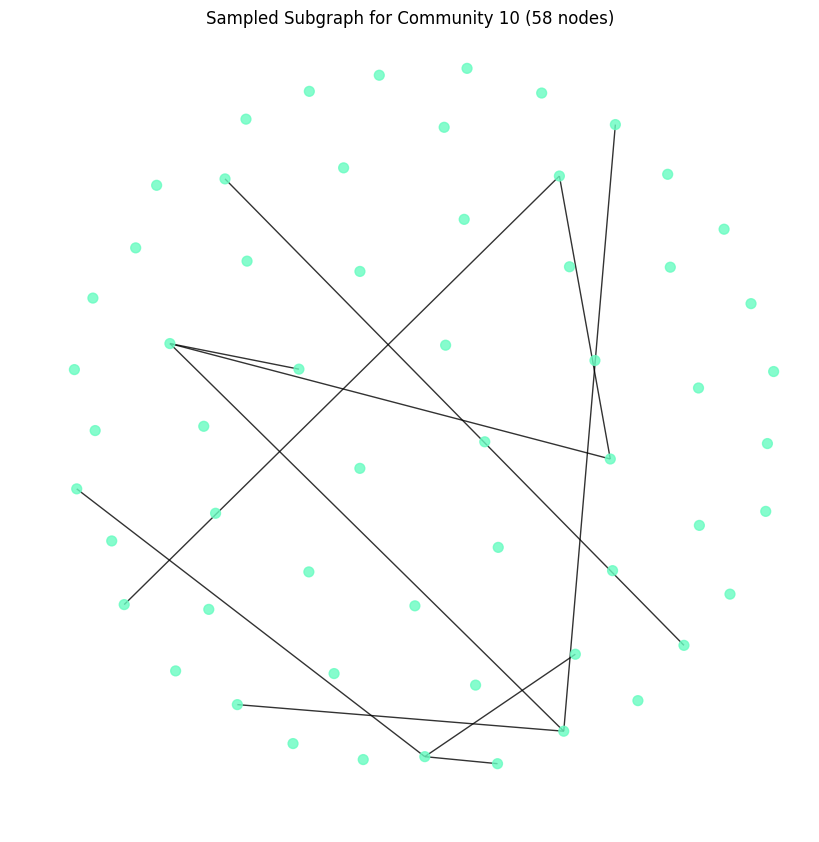

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


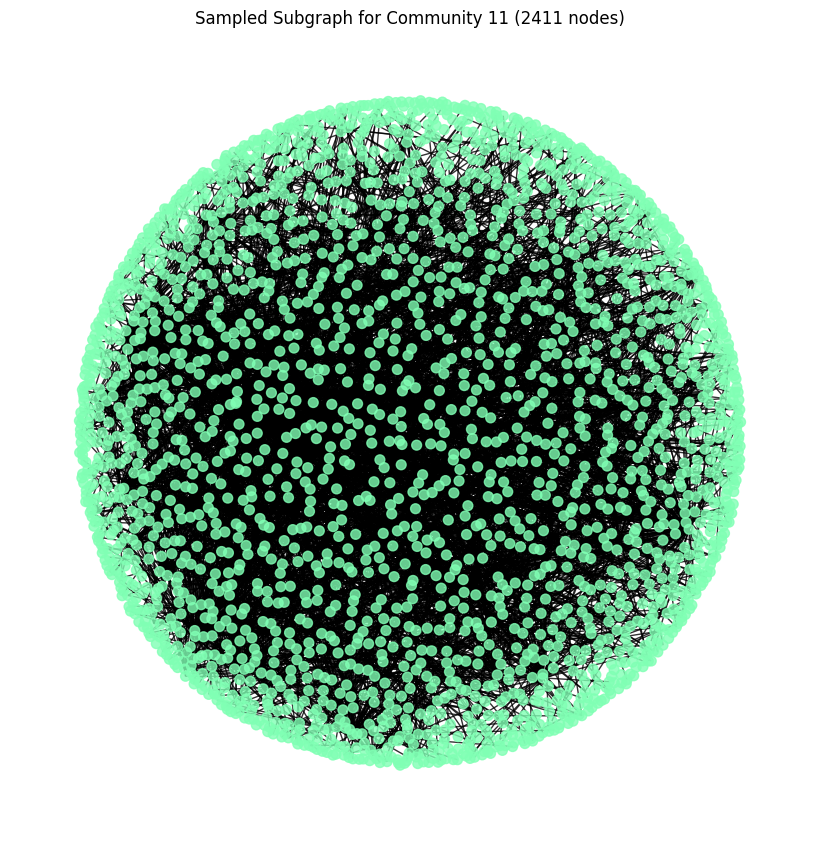

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


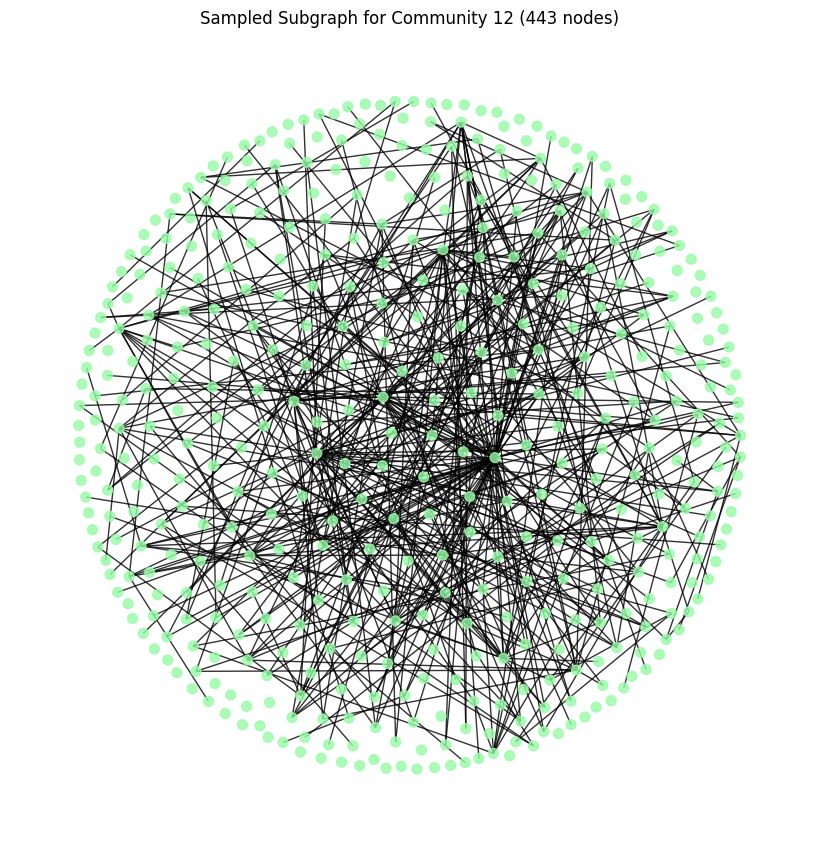

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


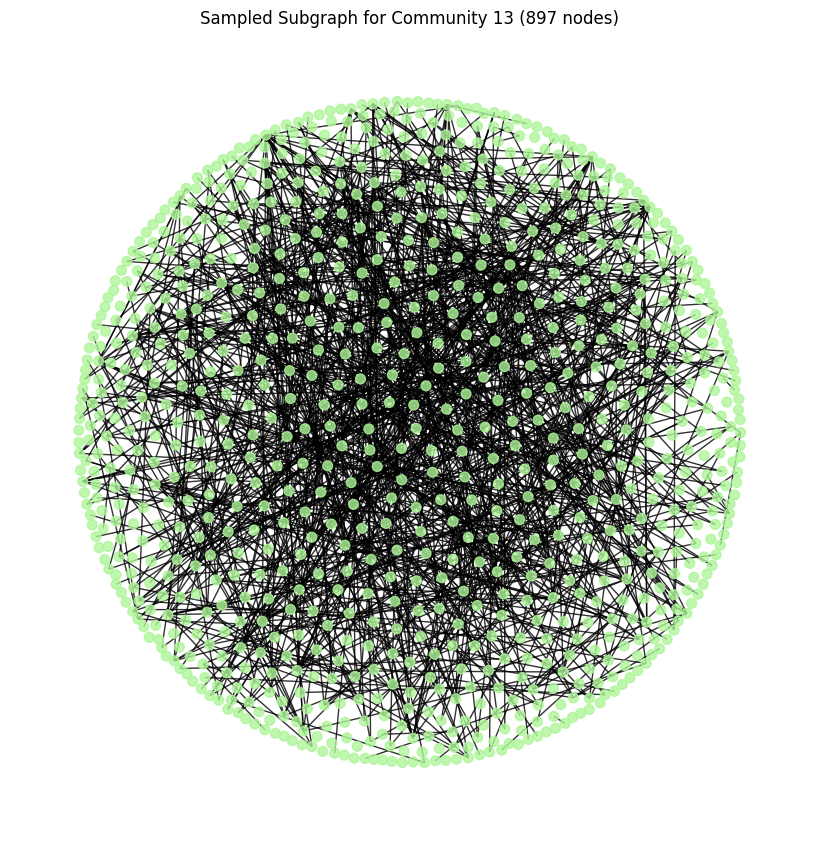

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


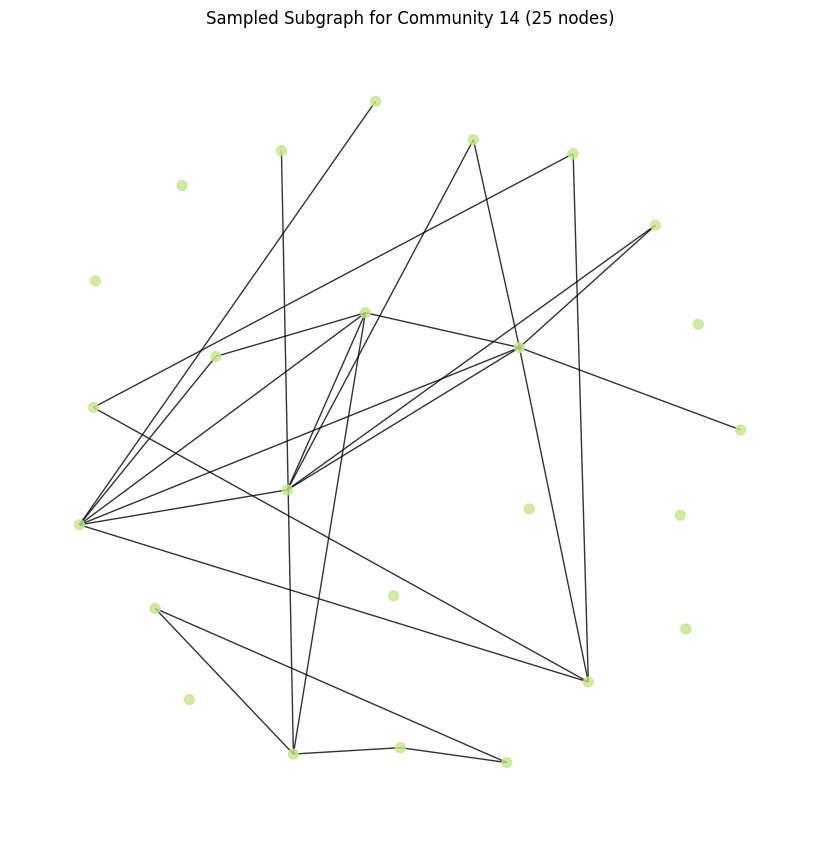

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


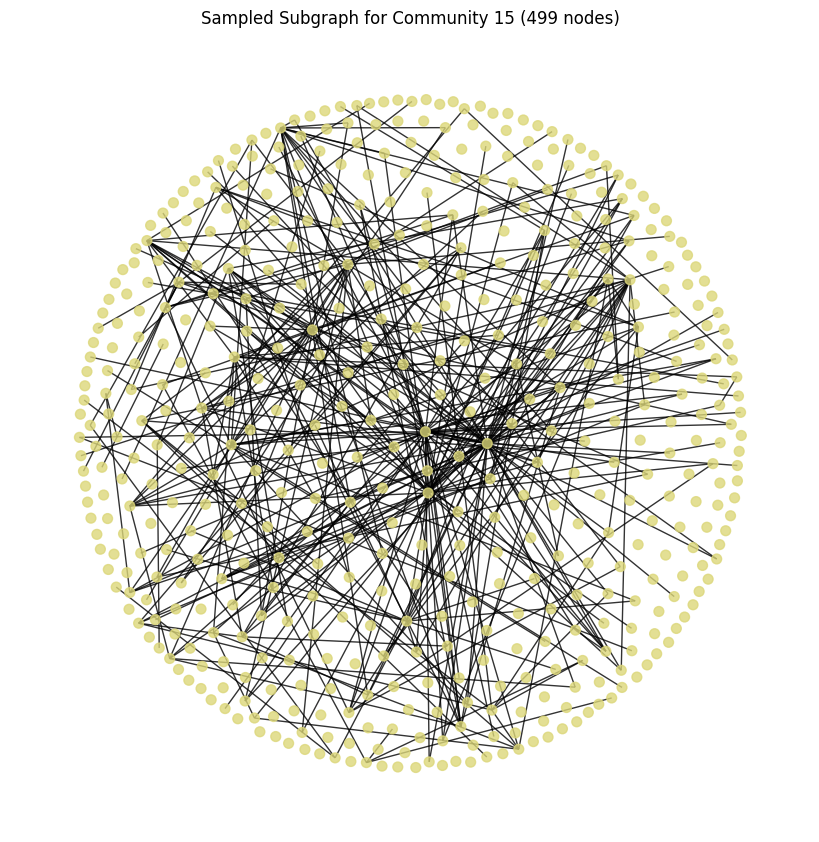

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


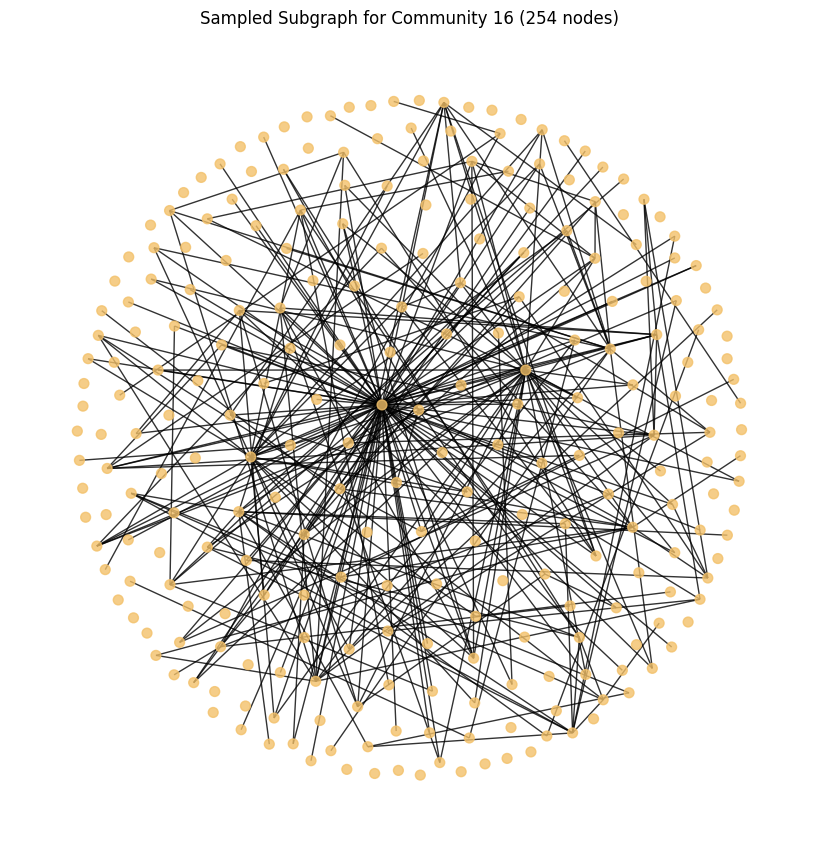

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


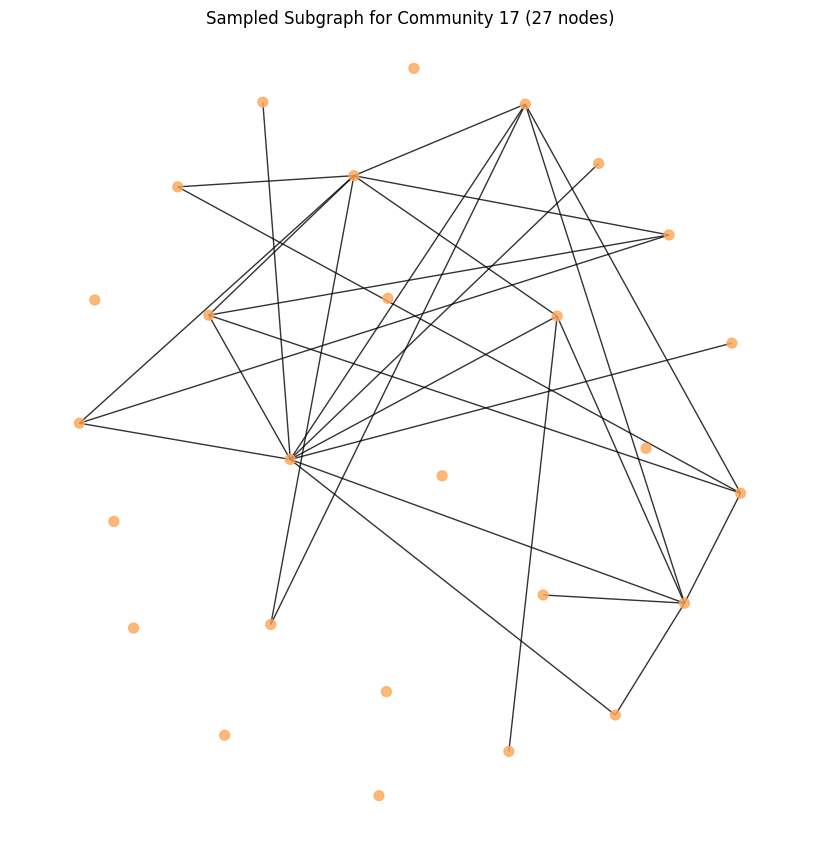

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


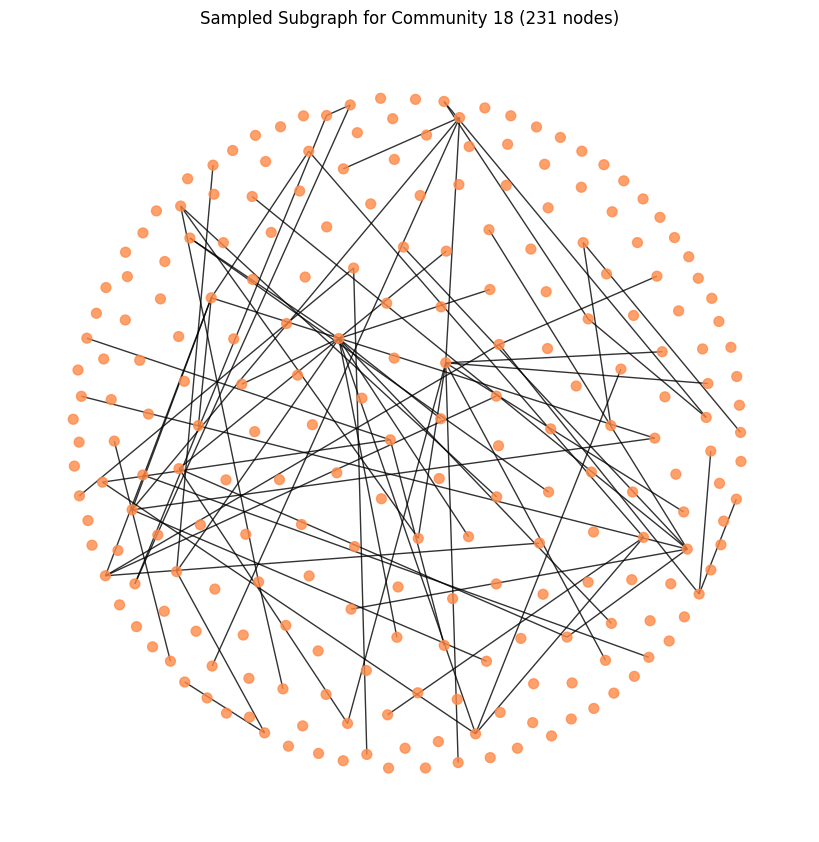

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


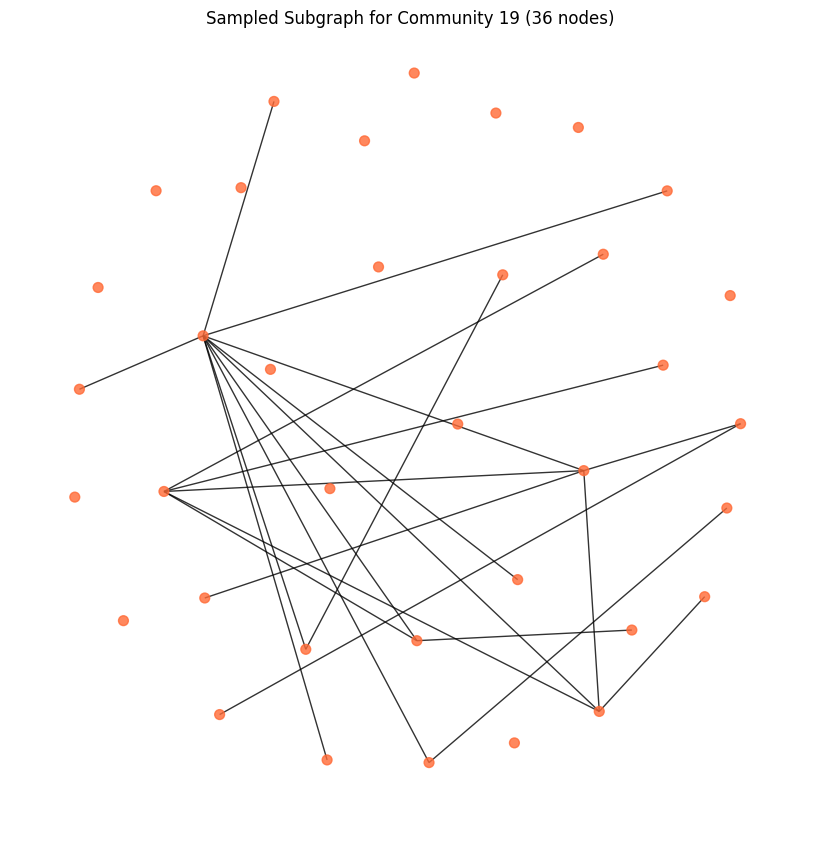

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


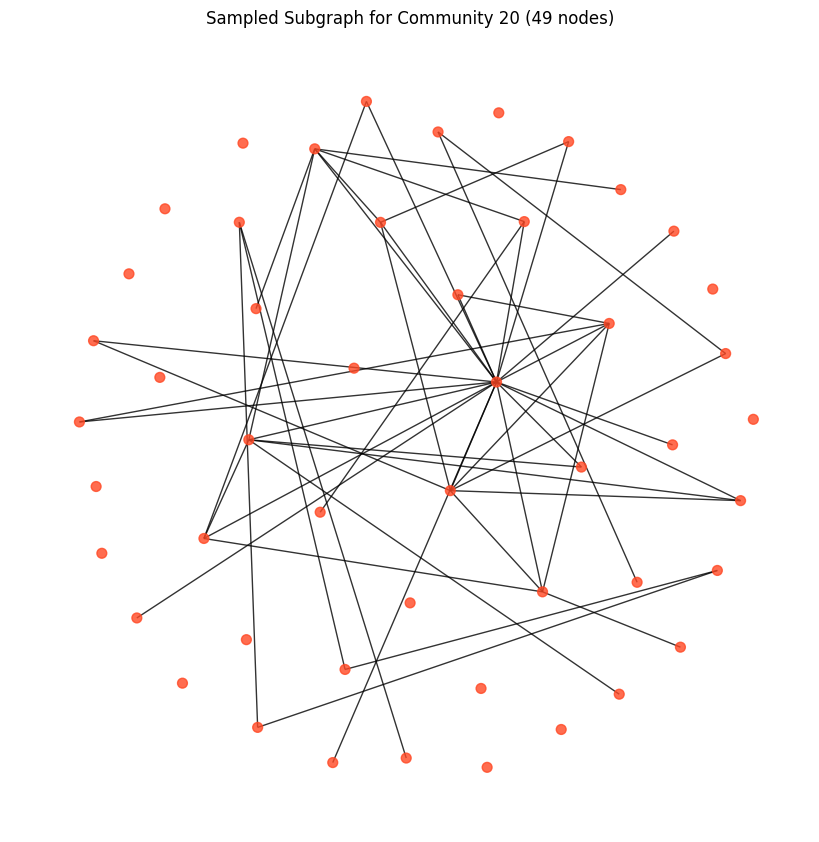

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


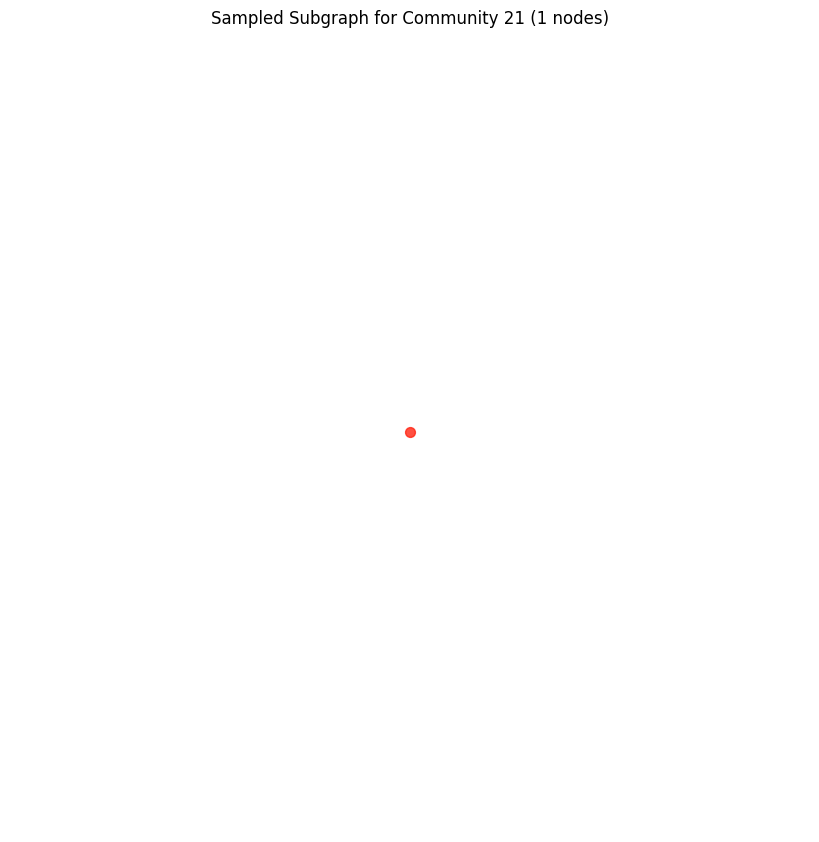

<ipython-input-87-5c87f21d2f5e>:16: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))


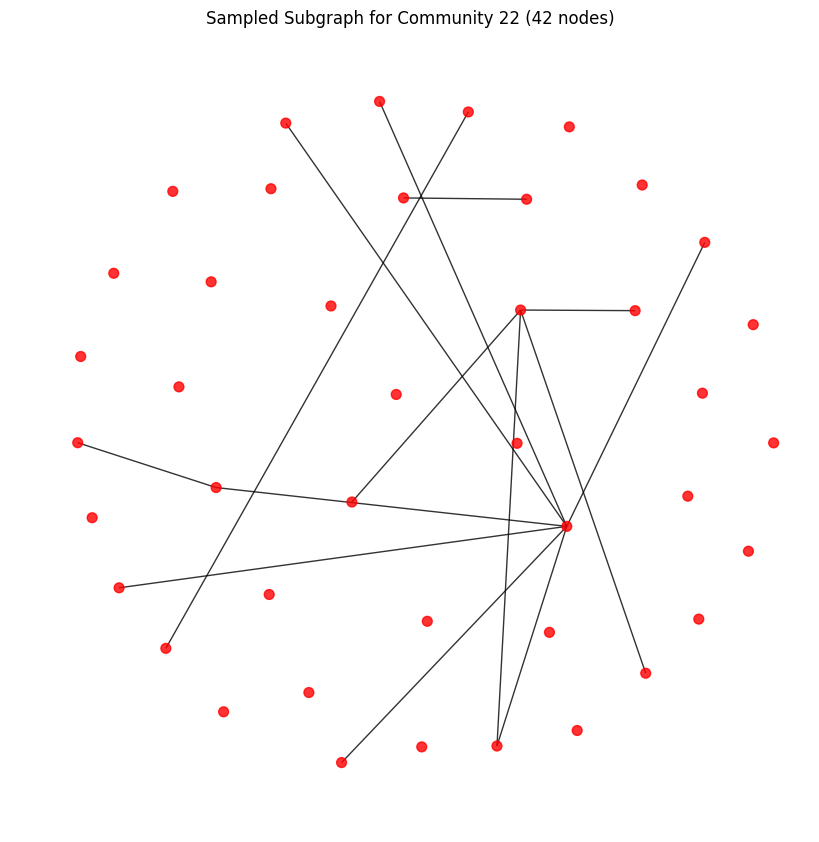

In [ ]:
import random
import matplotlib.pyplot as plt
import networkx as nx

# Function to create a sampled subgraph for a community
def create_sampled_community_subgraph(G, community_nodes, fraction=0.1):
    """
    Create and return a sampled subgraph for the specified community nodes.

    Parameters:
    - G: Original graph
    - community_nodes: List of nodes in the community
    - fraction: Fraction of nodes to sample (default is 0.1, i.e., 10%)
    """
    # Sample a fraction of the community nodes
    sampled_nodes = random.sample(community_nodes, max(1, int(fraction * len(community_nodes))))
    # Create the subgraph for the sampled nodes
    return G.subgraph(sampled_nodes)

# Fraction of each community to sample
sample_fraction = 0.05  # Adjust this to control the sampling size (e.g., 0.05 for 5%)

# Visualize sampled subgraphs for each community
for community_id, community_nodes in enumerate(partition, start=1):
    # Create the sampled community subgraph
    sampled_community_subgraph = create_sampled_community_subgraph(G, community_nodes, fraction=sample_fraction)

    # Get node colors for the community
    node_colors = [color_map(community_id) for _ in sampled_community_subgraph.nodes]

    # Plot the sampled community subgraph
    plt.figure(figsize=(8, 8))
    pos = nx.arf_layout(sampled_community_subgraph)  # Consistent layout
    nx.draw(sampled_community_subgraph, pos, node_color=node_colors, with_labels=False, node_size=50, alpha=0.8)
    plt.title(f"Sampled Subgraph for Community {community_id} ({len(sampled_community_subgraph.nodes)} nodes)")
    plt.show()

Plan of Action

1.   Seperate each community into a different variable set/list

2.   calculate statistics on views, maturity, life_time, creation date, updated date, dead_account, language, and affiliate (i.e. 1 = monetizable channel)
3. save calculated data in a dataframe or file
4. come to conclusions based on statistical analysis
5. apply machine learning algorithm (jaccard) for link prediction between super communities (or just between all nodes in each community)
6. come to conclusions

In [ ]:
print(G.size())
print(features_df.size)

6797557
1513026


In [ ]:
# addresses any possible key error from previous code block
# note: this should only occur if the notebook is run before the csv files are fully uploaded
# fill in empty community rows in dataframe
commune = []
nodata = []
for id in features_df['numeric_id']:
  if id not in G.nodes:
    # print(id, ' : ',G.nodes[id]['community']) # for debugging purposes
    nodata.append(id)
  else:
    commune.append(G.nodes[id]['community'])

In [ ]:
# addresses any possible key error from previous code block
print(len(nodata))
len(commune)
# these two add up to 168114; aka the amount we need for the community column
# Drops any columns with missing numeric_id reference
for id in nodata:
  if id in features_df['numeric_id']:
    features_df.drop(id, inplace=True)


0


In [ ]:
# confirm adjusted dataframe sizes
print(features_df.size)
print(len(commune))

1513026
168114


In [ ]:
# declares and initializes new column 'Community' in node dataframe
features_df['Community'] = commune

In [ ]:
features_df.head()

,views,mature,life_time,created_at,updated_at,numeric_id,dead_account,language,affiliate,Community
0,7879,1,969,2016-02-16,2018-10-12,0,0,EN,1,13
1,500,0,2699,2011-05-19,2018-10-08,1,0,EN,0,11
2,382502,1,3149,2010-02-27,2018-10-12,2,0,EN,1,5
3,386,0,1344,2015-01-26,2018-10-01,3,0,EN,0,13
4,2486,0,1784,2013-11-22,2018-10-11,4,0,EN,0,2


In [ ]:
# sorting the dataframe by Community Column
grouped_df = features_df.groupby('Community')
grouped_df.head()

,views,mature,life_time,created_at,updated_at,numeric_id,dead_account,language,affiliate,Community
0,7879,1,969,2016-02-16,2018-10-12,0,0,EN,1,13
1,500,0,2699,2011-05-19,2018-10-08,1,0,EN,0,11
2,382502,1,3149,2010-02-27,2018-10-12,2,0,EN,1,5
3,386,0,1344,2015-01-26,2018-10-01,3,0,EN,0,13
4,2486,0,1784,2013-11-22,2018-10-11,4,0,EN,0,2
...,...,...,...,...,...,...,...,...,...,...
109249,855,1,255,2018-01-30,2018-10-12,109249,0,EN,0,9
140484,7492,0,1936,2013-06-20,2018-10-08,140484,0,EN,1,21
142964,543,0,622,2017-01-28,2018-10-12,142964,0,EN,0,9
154843,1704,1,1556,2014-06-22,2018-09-25,154843,0,EN,0,4


In [ ]:
for community, group in grouped_df:
    print(f"Community {community}:")
    print(group['language'].value_counts())
    print("-" * 40)  # Separator for readability

Community 1:
language
FR       6149
EN        213
OTHER      25
DE          5
JA          4
TR          3
RU          2
IT          1
TH          1
SV          1
ES          1
PT          1
Name: count, dtype: int64
----------------------------------------
Community 2:
language
EN       29806
OTHER      220
DE         120
NL          68
SV          67
ES          66
RU          55
PT          50
FR          42
FI          38
NO          33
DA          28
JA          27
PL          24
IT          18
HU          17
KO          10
ZH           9
CS           8
TR           8
TH           3
Name: count, dtype: int64
----------------------------------------
Community 3:
language
ES       4821
EN        204
OTHER      34
DE          5
FR          3
RU          2
SV          1
JA          1
TR          1
Name: count, dtype: int64
----------------------------------------
Community 4:
language
EN    3
Name: count, dtype: int64
----------------------------------------
Community 5:
language
EN   

In [ ]:
majority = {}

for community, group in grouped_df:
    total_count = group.shape[0]
    majority_count = group['language'].value_counts().iloc[0]
    majority_percentage = (majority_count / total_count) * 100
    majority[community] = majority_percentage

# Print the results
for community, percentage in majority.items():
    print(f"Community {community}: {percentage:.2f}%")

Community 1: 95.99%
Community 2: 97.03%
Community 3: 95.05%
Community 4: 100.00%
Community 5: 92.31%
Community 6: 95.86%
Community 7: 94.24%
Community 8: 97.25%
Community 9: 100.00%
Community 10: 94.04%
Community 11: 90.34%
Community 12: 94.67%
Community 13: 97.27%
Community 14: 86.00%
Community 15: 92.32%
Community 16: 53.71%
Community 17: 92.93%
Community 18: 94.48%
Community 19: 95.77%
Community 20: 62.08%
Community 21: 100.00%
Community 22: 90.31%


In [ ]:
language_distribution = grouped_df['language'].value_counts()
language_distribution.to_csv('language_distribution.csv', index=False)

In [ ]:
# stores statistical data
mode_df = pd.DataFrame()
median_df = pd.DataFrame()
mean_df = pd.DataFrame()

# find mean, median, and mode for each community
num = 1
while num <= num_communities:
  # retrieve individual community data
  com = grouped_df.get_group(num)

  # Perform aggregation on the grouped data
  com.drop(columns=['created_at', 'updated_at'], inplace=True)

  # confirm size of community
  print('community ', num, '\t num rows: ', len(com))
  # print(nx.average_clustering(com))
  # size_rows  = pd.concat([size_df, pd.DataFrame([[num, len(com)]])])

  # calculate mode of individual community & save only the first row
  mode_values = com.mode()
  mode_df = pd.concat([mode_df, mode_values[:1]])

  # calculate median of individual community
  # save it along with community number & size metrics into dataframe
  com.drop(columns=['language'], inplace=True)
  median_values = com.median()
  median_row = {'views': median_values['views'],
             'mature': median_values['mature'],
             'life_time': median_values['life_time'],
             'numeric_id': median_values['numeric_id'],
             'dead_account': median_values['dead_account'],
             'affiliate': median_values['affiliate'],
             'Community': median_values['Community'],
              'Size': len(com)}
  median_df = pd.concat([median_df, pd.DataFrame([median_row])])

  # calculate mean of individual community
  # save it along with community number & size metrics into dataframe
  mean_values = com.mean()
  mean_row = {'views': mean_values['views'],
            'mature': mean_values['mature'],
            'life_time': mean_values['life_time'],
            'numeric_id': mean_values['numeric_id'],
            'dead_account': mean_values['dead_account'],
            'affiliate': mean_values['affiliate'],
            'Community': mean_values['Community'],
             'Size': len(com) }
  mean_df = pd.concat([mean_df, pd.DataFrame([mean_row])])

  num += 1

<ipython-input-41-8db22fa76f4d>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['created_at', 'updated_at'], inplace=True)
<ipython-input-41-8db22fa76f4d>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['language'], inplace=True)
<ipython-input-41-8db22fa76f4d>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['created_at', 'updated_at'], inplace=True)
<ipython-input-41-8db22fa7

community  1 	 num rows:  6406
community  2 	 num rows:  30717
community  3 	 num rows:  5072
community  4 	 num rows:  3
community  5 	 num rows:  20256
community  6 	 num rows:  1980
community  7 	 num rows:  347
community  8 	 num rows:  3788
community  9 	 num rows:  5


<ipython-input-41-8db22fa76f4d>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['language'], inplace=True)
<ipython-input-41-8db22fa76f4d>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['created_at', 'updated_at'], inplace=True)
<ipython-input-41-8db22fa76f4d>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['language'], inplace=True)
<ipython-input-41-8db22fa76f4d>:12: Settin

community  10 	 num rows:  1174
community  11 	 num rows:  48220
community  12 	 num rows:  8866
community  13 	 num rows:  17941
community  14 	 num rows:  507
community  15 	 num rows:  9985
community  16 	 num rows:  5090
community  17 	 num rows:  552
community  18 	 num rows:  4635
community  19 	 num rows:  732
community  20 	 num rows:  989
community  21 	 num rows:  3
community  22 	 num rows:  846


<ipython-input-41-8db22fa76f4d>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['language'], inplace=True)
<ipython-input-41-8db22fa76f4d>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['created_at', 'updated_at'], inplace=True)
<ipython-input-41-8db22fa76f4d>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com.drop(columns=['language'], inplace=True)
<ipython-input-41-8db22fa76f4d>:12: Settin

In [ ]:
# set index of dataframe to Community
mean_df.set_index('Community', inplace=True)
median_df.set_index('Community', inplace=True)
mode_df.set_index('Community', inplace=True)

In [ ]:
# verify dataframe was filled correctly
print('mean: \n', mean_df)
print('\nmedian: \n', median_df)
print('\nmode: \n', mode_df)

mean: 
                    views    mature    life_time     numeric_id  dead_account  \
Community                                                                      
1.0        183868.922416  0.383391  1421.069778   84423.570247      0.021386   
2.0        126355.545398  0.609630  1640.548100   84121.741576      0.035095   
3.0        145296.679219  0.303233  1326.001183   83887.698935      0.015970   
4.0          2506.000000  0.666667  2100.666667  106717.333333      0.000000   
5.0        103191.815067  0.385170  1848.765353   83684.494026      0.035545   
6.0        478364.219697  0.362121  1274.215657   83424.393939      0.015152   
7.0        233077.305476  0.449568  1345.193084   84852.158501      0.008646   
8.0         69515.472017  0.538279  1363.740496   84594.193242      0.041711   
9.0           966.800000  0.400000  1385.000000  103861.600000      0.000000   
10.0       171586.847530  0.218058  1254.644804   82908.367973      0.019591   
11.0       248940.735587  0.4409

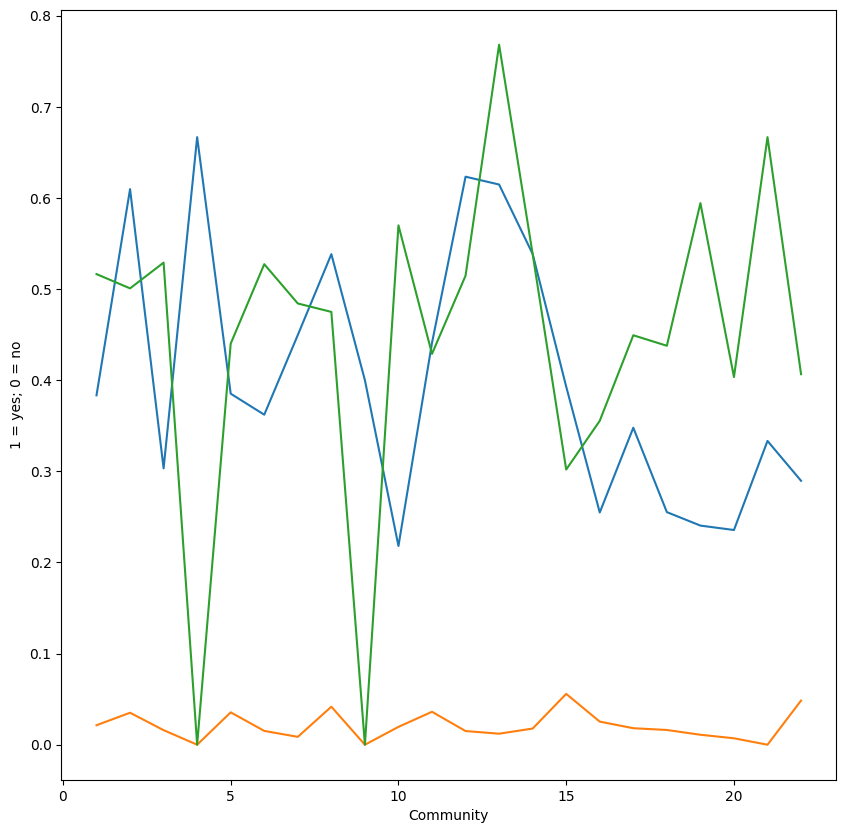

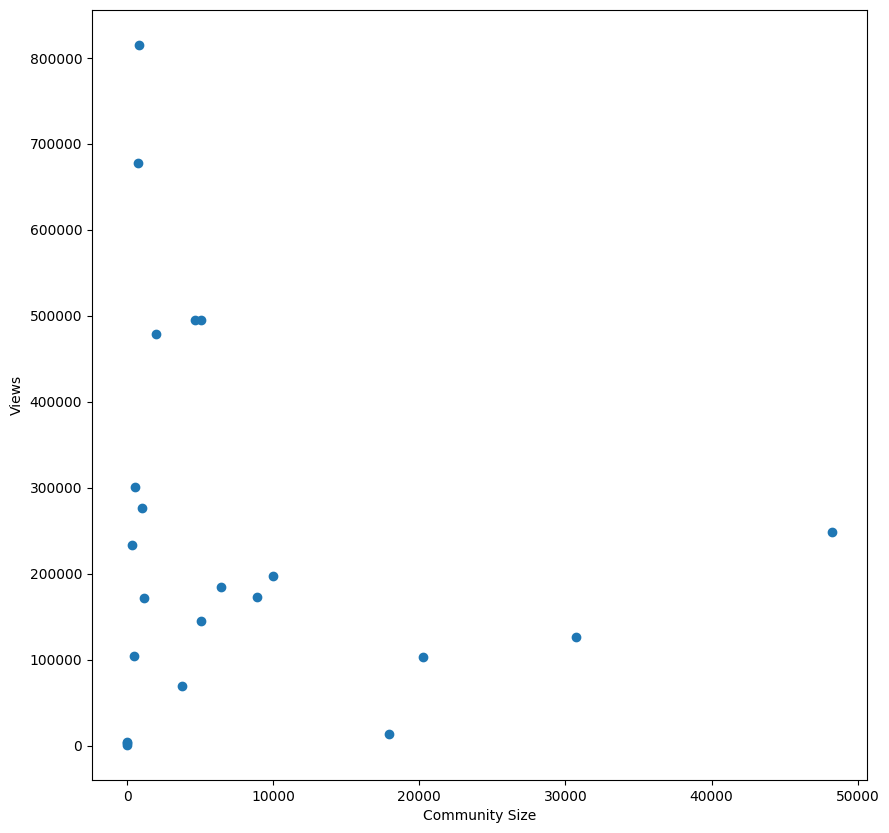

<Figure size 1000x1000 with 0 Axes>

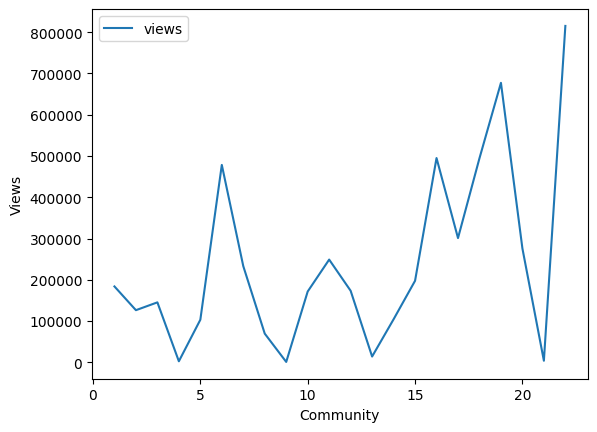

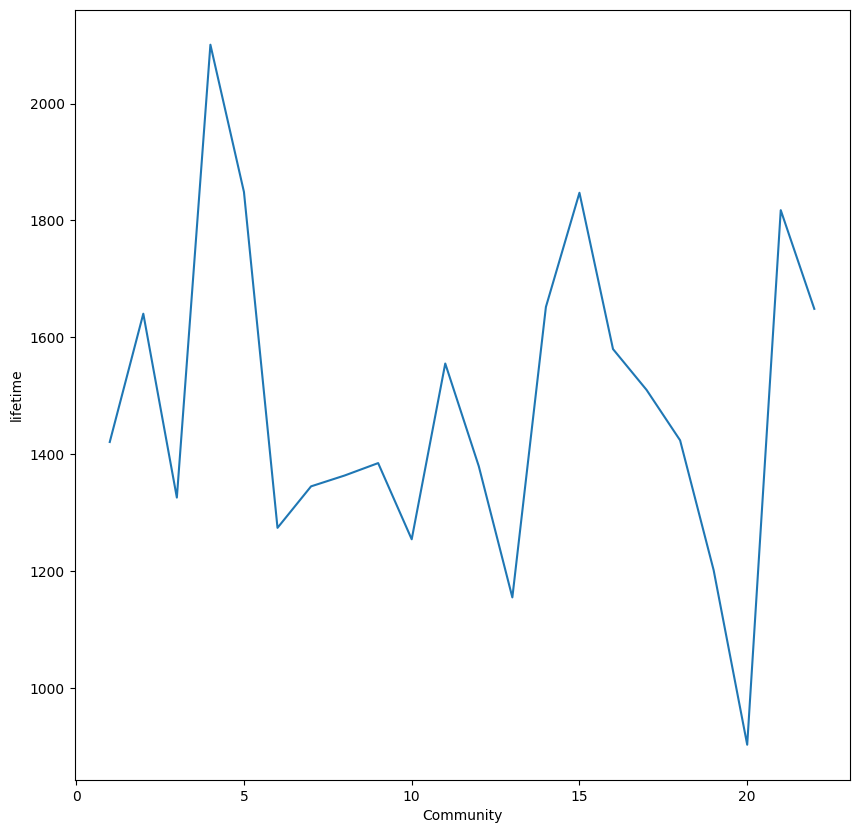

In [ ]:
# plotting the mean, median, & mode in comparison to community
plt.figure(figsize=(10, 10))
# mean_df[['mature', 'dead_account', 'affiliate']].plot()
plt.plot(mean_df[['mature', 'dead_account', 'affiliate']])
plt.xlabel("Community")
plt.ylabel("1 = yes; 0 = no")
plt.show()

# found relationship with view in relation to community size
# note that this doesn't exist for other measures hence it was not graphed
plt.figure(figsize=(10, 10))
plt.scatter(mean_df['Size'], mean_df[['views']])
plt.xlabel("Community Size")
plt.ylabel("Views")
plt.show()


plt.figure(figsize=(10, 10))
mean_df[['views']].plot()
plt.xlabel("Community")
plt.ylabel("Views")
plt.show()

plt.figure(figsize=(10, 10))
# mean_df[['life_time']].plot()
plt.plot(mean_df[['life_time']])
plt.xlabel("Community")
plt.ylabel("lifetime")
plt.show()

<Figure size 1000x1000 with 0 Axes>

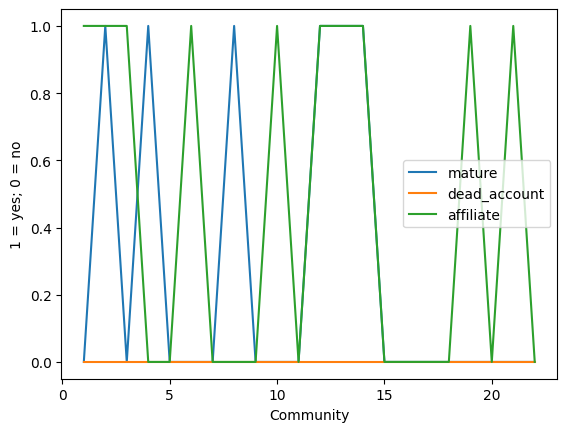

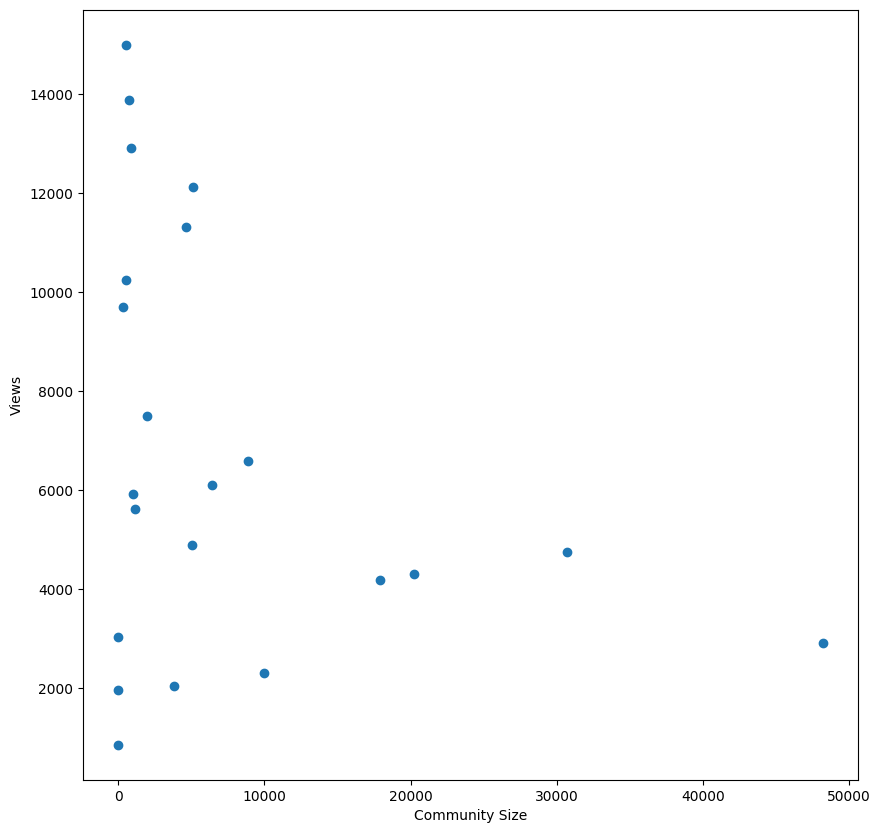

<Figure size 1000x1000 with 0 Axes>

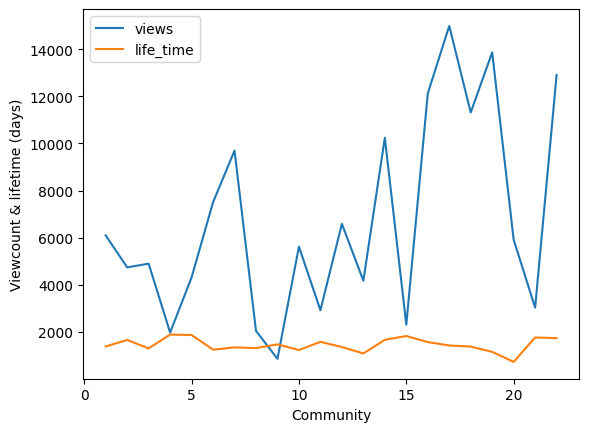

In [ ]:
# plotting the mean, median, & mode in comparison to community
plt.figure(figsize=(10, 10))
median_df[['mature', 'dead_account', 'affiliate']].plot()
plt.xlabel("Community")
plt.ylabel("1 = yes; 0 = no")
plt.show()

# found relationship with view count in relation to community size
# note that this doesn't exist for other measures hence it was not graphed
plt.figure(figsize=(10, 10))
plt.scatter(median_df['Size'], median_df['views'])
plt.xlabel("Community Size")
plt.ylabel("Views")
plt.show()

plt.figure(figsize=(10, 10))
median_df[['views', 'life_time']].plot()
plt.xlabel("Community")
plt.ylabel("Viewcount & lifetime (days)")
plt.show()

<Figure size 1000x1000 with 0 Axes>

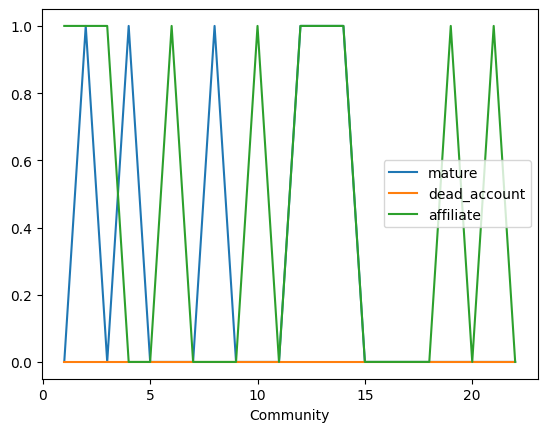

<Figure size 1000x1000 with 0 Axes>

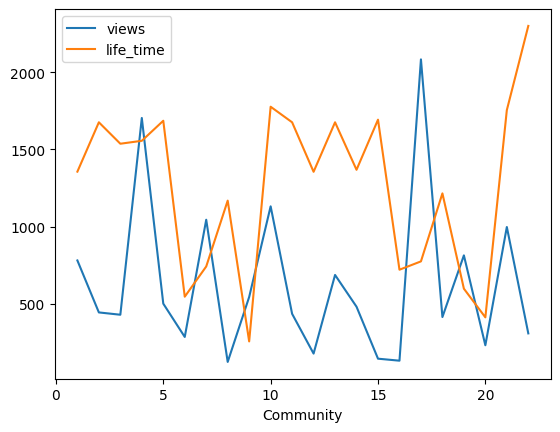

In [ ]:
# plotting the mean, median, & mode in comparison to community
plt.figure(figsize=(10, 10))
mode_df[['mature', 'dead_account', 'affiliate']].plot()
plt.show()

plt.figure(figsize=(10, 10))
mode_df[['views', 'life_time']].plot()
plt.show()

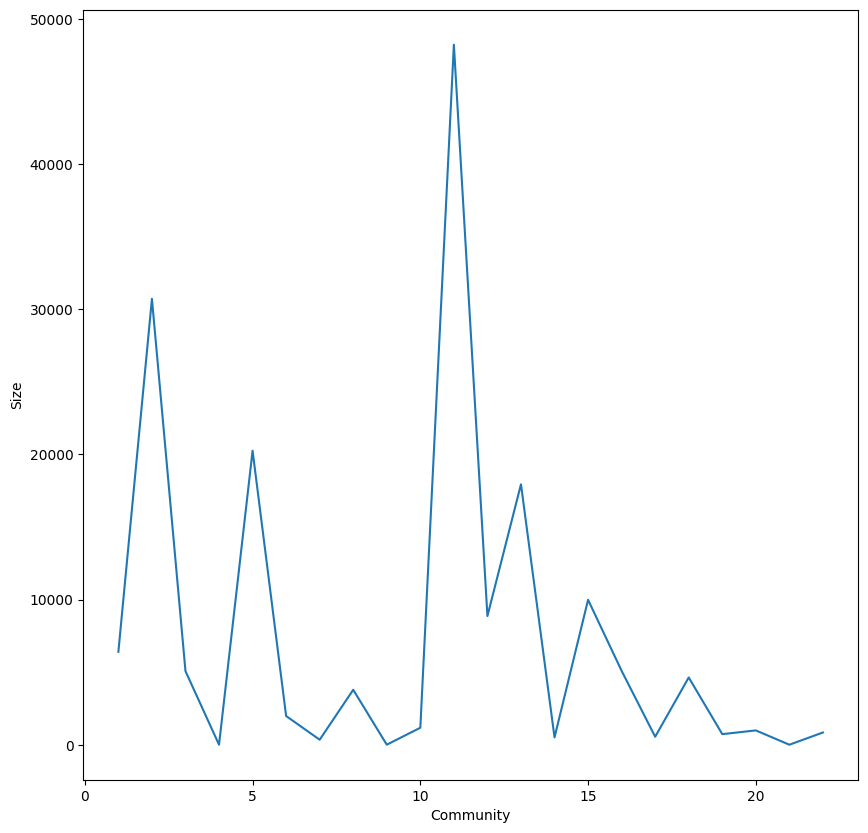

In [ ]:
# graph relative sizes of datasets
plt.figure(figsize=(10, 10))
plt.plot(median_df['Size'])
plt.xlabel("Community")
plt.ylabel("Size")
plt.show()

Link Prediction

In [ ]:
import random
G.number_of_edges()
edge_subset = random.sample(G.edges(), int(0.03 * G.number_of_edges()))
G_train = G.copy()
G_train.remove_edges_from(edge_subset)

<ipython-input-48-3c3721b46c99>:3: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  edge_subset = random.sample(G.edges(), int(0.03 * G.number_of_edges()))


In [ ]:
prediction_jaccard = nx.jaccard_coefficient(G_train, edge_subset)
score, label = zip(*[(s, (u,v) in edge_subset) for (u,v,s) in prediction_jaccard])

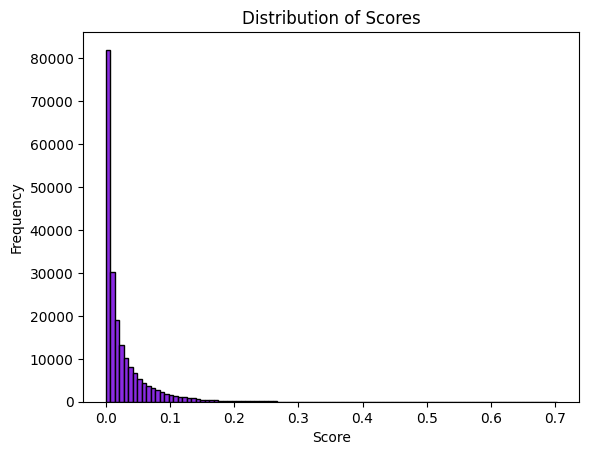

In [ ]:
# plot jaccard similarity score distribution of graph
plt.hist(score, bins=100, edgecolor='black', color='blueviolet')
plt.title("Distribution of Scores")
plt.xlabel("Score")
plt.ylabel("Frequency")
plt.show()

In [ ]:
# Everybody above a threshold is included.
# threshold is set to graph transitivity number
predicted_edges = 0
for s in score:
  if s > 0.0184:
    predicted_edges += 1

In [ ]:
# calculate accuracy of predicted edges
predicted = predicted_edges / len(edge_subset)
predicted

0.38749350254504084

In [ ]:
#Everybody above a threshold is included.
# threshold is set to graph density number
predicted_edges = 0
for s in score:
  if s > 0.0005:
    predicted_edges += 1

In [ ]:
#calculate accuracy of predicted edges
predicted = predicted_edges / len(edge_subset)
predicted

0.9008267704951797

Apply Link Prediction on sampled dataset to increase speed

In [ ]:
import random

# Create Subgraph
sampled_nodes = random.sample(list(G.nodes()), int(0.25 * len(G.nodes())))

# Create the subgraph
subgraph = G.subgraph(sampled_nodes)
print(subgraph.number_of_nodes())

42028


In [ ]:
# plt.figure(figsize=(10, 10))
# nx.draw(subgraph, with_labels=True, node_size=50, node_color="lightblue", font_size=8)
# plt.show()

In [ ]:
import random
subgraph.number_of_edges()
edge_subset = random.sample(subgraph.edges(), int(0.125 * subgraph.number_of_edges()))
G_train = subgraph.copy()
G_train.remove_edges_from(edge_subset)

<ipython-input-80-05f27750eecb>:3: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  edge_subset = random.sample(subgraph.edges(), int(0.125 * subgraph.number_of_edges()))


In [ ]:
prediction_jaccard = nx.jaccard_coefficient(G_train, edge_subset)
score, label = zip(*[(s, (u,v) in edge_subset) for (u,v,s) in prediction_jaccard])

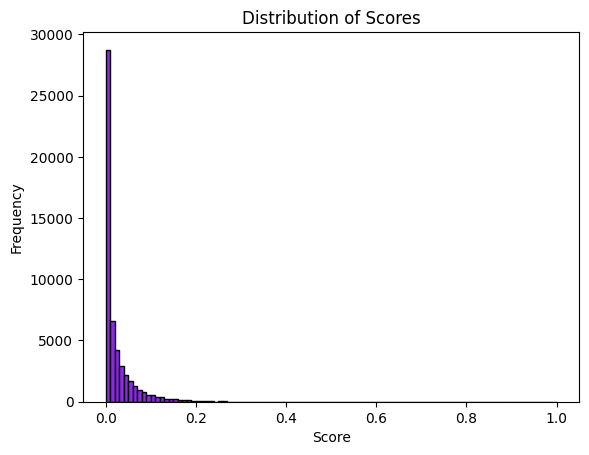

In [ ]:
plt.hist(score, bins=100, edgecolor='black', color='blueviolet')
plt.title("Distribution of Scores")
plt.xlabel("Score")
plt.ylabel("Frequency")
plt.show()

In [ ]:
#Everybody above a threshold is included.
# threshold is set to graph transitivity number
predicted_edges = 0
for s in score:
  if s > 0.0184:
    predicted_edges += 1

In [ ]:
#calculate accuracy of predicted edges
predicted = predicted_edges / len(edge_subset)
predicted

0.34365554605075566

In [ ]:
#Everybody above a threshold is included.
# threshold is set to graph density number
predicted_edges = 0
for s in score:
  if s > 0.0005:
    predicted_edges += 1

In [ ]:
#calculate accuracy of predicted edges
predicted = predicted_edges / len(edge_subset)
predicted

0.7208440262332478